# Temperature
env: `phd_v3`

Voir : https://github.com/mickaellalande/PhD/blob/master/CICLAD/Himalaya/CMIP6_IPSL_bias/Temperature.ipynb pour plus de détails

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle # For rectangles
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats # For linregress (trends)
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
sys.path.insert(1, '../../../') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]
Virtual memory usage - total: 252 GB / available: 67 GB / percent used: 73.4 %


# Load model data

In [2]:
# Define period
period = slice('1982','2014')

# Define zone
latlim=(10,50)
lonlim=(60,110)

# Model
institute = 'IPSL'
model = 'IPSL-CM6A-LR'
var = 'tas'
if var in ['tas', 'pr']:
    table = 'Amon'
elif var in ['snc']:
    table = 'LImon'
    
var_label = 'Near-Surface Air Temperature [°C]'
var_label_trends = 'Near-Surface Air Temperature trends [°C/dec]'
var_label_bias = 'Near-Surface Air Temperature bias [°C]'
cmap='CoolWarm'
levels=plot.arange(-30,30,5)

## Load ensemble mean

In [3]:
realization = 'ens'
# Load historical ens
experiment='historical'
da_historical = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
).sel(time=period)
# Load amip ens
experiment='amip'
da_amip = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
).sel(time=period)

# No ensembles for land-hist and HR
realization = 'r1i1p1f1'
# Load land-hist
da_land_hist = xr.open_mfdataset(
    '/bdd/CMIP6/LS3MIP/'+institute+'/'+model+'/land-hist/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]
# Load HighResMIP
da_HR = xr.open_mfdataset(
    '/bdd/CMIP6/HighResMIP/'+institute+'/IPSL-CM6A-ATM-HR/highresSST-present/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

## Convert units

In [4]:
da_historical = da_historical-273.15
da_amip = da_amip-273.15
da_land_hist = da_land_hist-273.15
da_HR = da_HR-273.15

# Load obs

## cru_ts4.04
https://crudata.uea.ac.uk/cru/data/hrg/  

In [5]:
ds = xr.open_dataset('/data/mlalande/CRU/tmp/cru_ts4.04.1901.2019.tmp.dat.nc') \
        .sel(time=period)
obs = ds.tmp

In [6]:
obs_longname = 'CRU TS v. 4.00'
obs_name = 'CRU'

### Regrid using xESMF (https://xesmf.readthedocs.io/en/latest/) 

In [7]:
regridder_obs = xe.Regridder(obs, da_historical, 'bilinear', periodic=True, reuse_weights=True)
obs_regrid = regridder_obs(obs)

Reuse existing file: bilinear_360x720_143x144_peri.nc


Text(0.5, 1.0, 'Regrid')

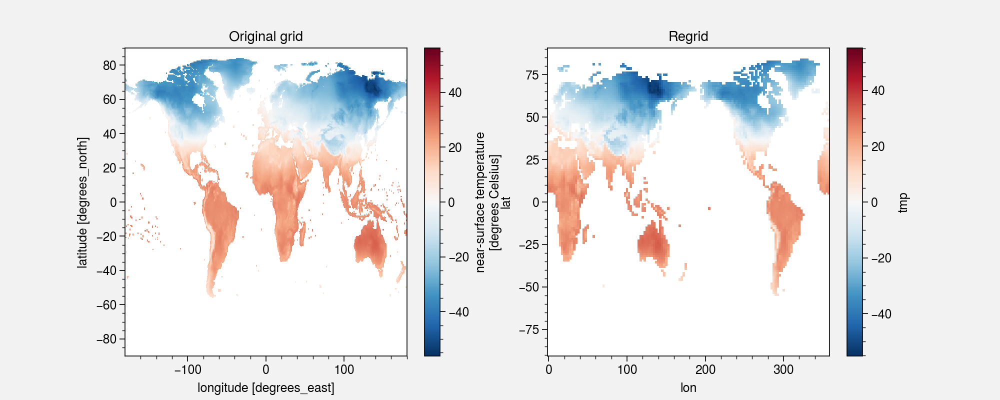

In [8]:
plt.figure(figsize=(10,4))
plt.subplot(121)
obs[0].plot()
plt.title('Original grid')
plt.subplot(122)
obs_regrid[0].plot()
plt.title('Regrid')

### Regrid HR

In [9]:
# Regrid HighResMIP
regridder_HR = xe.Regridder(da_HR, da_historical, 'bilinear', periodic=True, reuse_weights=True)
print(regridder_HR)

# Regrid the data
da_HR_regrid = regridder_HR(da_HR)

Reuse existing file: bilinear_361x512_143x144_peri.nc
xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_361x512_143x144_peri.nc 
Reuse pre-computed weights? True 
Input grid shape:           (361, 512) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      True


Text(0.5, 1.0, 'da_HR_regrid')

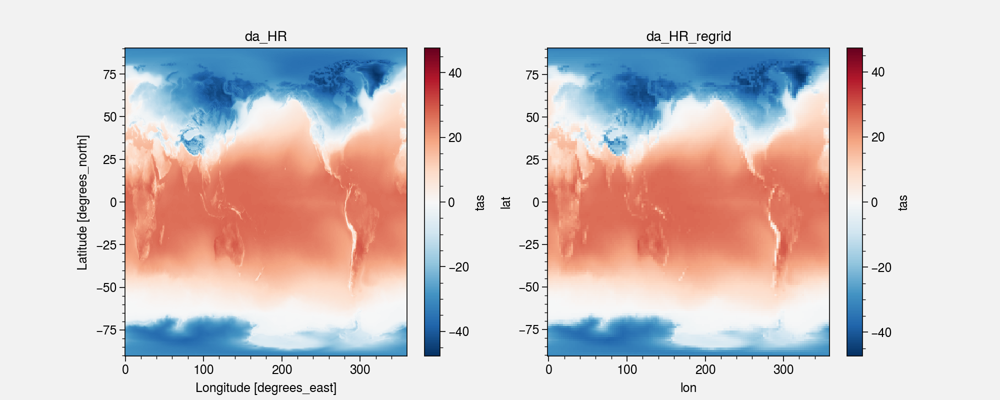

In [10]:
plt.figure(figsize=(10,4))
plt.subplot(121)
da_HR[0].plot()
plt.title('da_HR')
plt.subplot(122)
da_HR_regrid[0].plot()
plt.title('da_HR_regrid')

## Annual Climatology

In [11]:
latlim=(10,50)
lonlim=(60,110)

da_historical_clim = u.clim(da_historical.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_historical_clim.load()

da_amip_clim = u.clim(da_amip.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_amip_clim.load()

da_land_hist_clim = u.clim(da_land_hist.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_land_hist_clim.load()

da_HR_regrid_clim = u.clim(da_HR_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_HR_regrid_clim.load()

da_HR_clim = u.clim(da_HR.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
da_HR_clim.load()

obs_regrid_clim = u.clim(obs_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
obs_regrid_clim.load()

obs_clim = u.clim(obs.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])))
obs_clim.load()

<xarray.DataArray (lat: 80, lon: 100)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ..., 26.25409479,
                nan,         nan],
       ...,
       [ 6.20213239,  6.27607245,  6.43787449, ..., -3.99371115,
        -4.13232397, -3.14956448],
       [ 5.68308314,  5.59138813,  5.66994949, ..., -2.43059823,
        -3.07945747, -3.5495645 ],
       [ 5.31719082,  5.1856136 ,  5.20026557, ..., -3.03841372,
        -2.91444458, -3.72508925]])
Coordinates:
  * lon      (lon) float32 60.25 60.75 61.25 61.75 ... 108.75 109.25 109.75
  * lat      (lat) float32 10.25 10.75 11.25 11.75 ... 48.25 48.75 49.25 49.75
Attributes:
    long_name:                   near-surface temperature
    units:                       degrees Celsius
    correlation_decay_distance:  1200.0

In [12]:
# We remove HR for keeping the resolution

concat = xr.concat(
    [
        da_historical_clim,
        da_amip_clim,
        da_land_hist_clim,
    ],
    pd.Index(
        [
            'Historical (32)',
            'AMIP (21)',
            'land-hist (1)',
        ], 
        name='exp'
    )
)

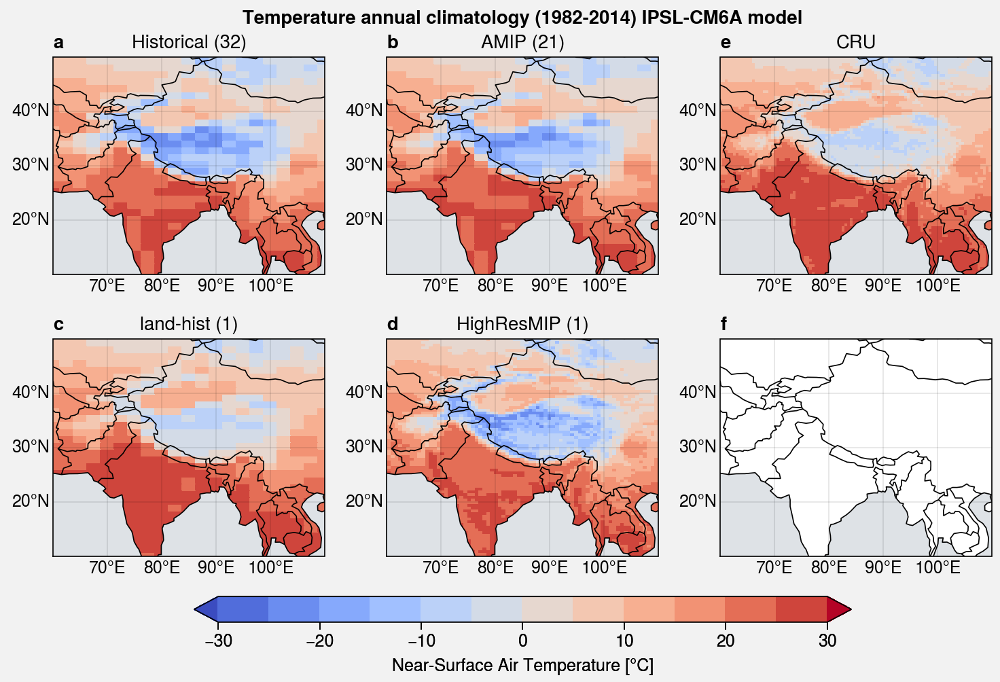

In [13]:
# Final plot

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=2)

extend='both'

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i), cmap=cmap, levels=levels, extend=extend)
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(da_HR_clim, cmap=cmap, levels=levels, extend=extend)
axs[3].format(title='HighResMIP (1)') 

axs[4].pcolormesh(obs_clim, cmap=cmap, levels=levels, extend=extend)
axs[4].format(title=obs_name) 

f.colorbar(m, label=var_label, loc='b', length=0.7)

axs.format(
    labels=True, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Temperature annual climatology (1982-2014) IPSL-CM6A model",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/tas_clim_1982-2014_IPSL-CM6A_exp.jpg')

## Bias

In [14]:
bias = xr.concat(
    [
        (da_historical_clim-obs_regrid_clim),
        (da_amip_clim-obs_regrid_clim),
        (da_land_hist_clim-obs_regrid_clim),
        (da_HR_regrid_clim-obs_regrid_clim)
    ],
    pd.Index(
        [
            'Historical (32) - '+obs_name,
            'AMIP (21) - '+obs_name,
            'land-hist (1) - '+obs_name,
            'HighResMIP (1) - '+obs_name
        ], 
        name='bias'
    )
)

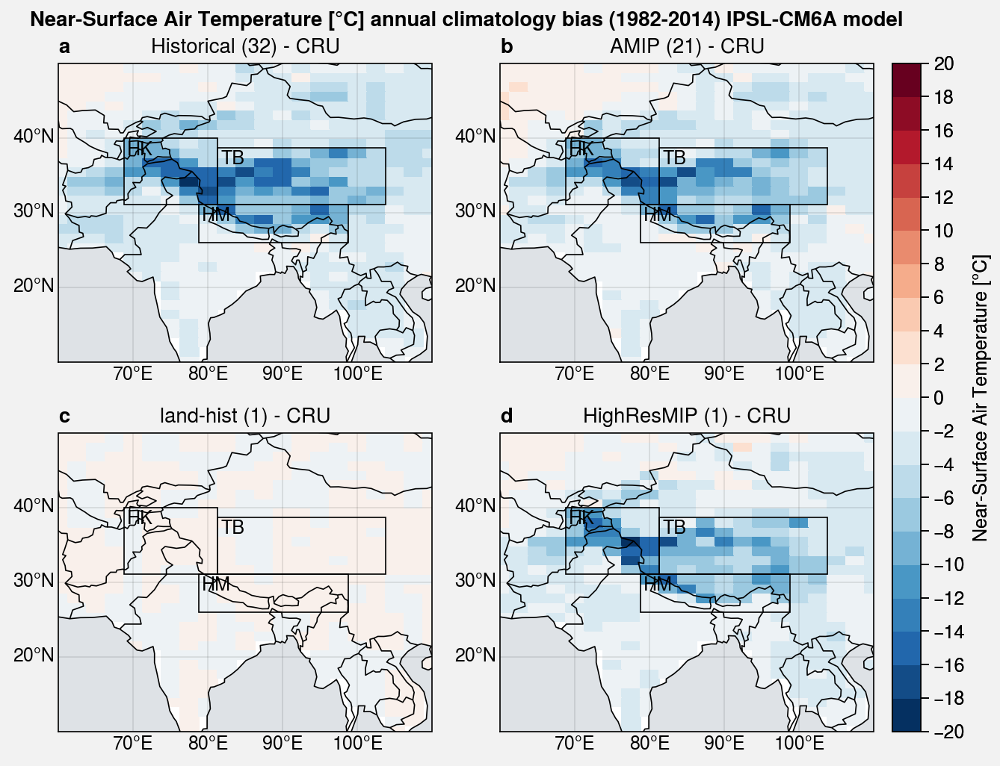

In [15]:
# Final plot

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, share=3, axwidth=2.5)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias.isel(bias=i), 
        cmap='RdBu_r', 
        levels=plot.arange(-20,20,2), 
    )
    ax.format(title=str(bias.isel(bias=i).bias.values))

f.colorbar(m, label=var_label)

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

axs.format(
    labels=True, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle=var_label+" annual climatology bias (1982-2014) IPSL-CM6A model",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/tas_clim_bias_1982-2014_IPSL-CM6A_CRU.jpg')

## Obs vs model

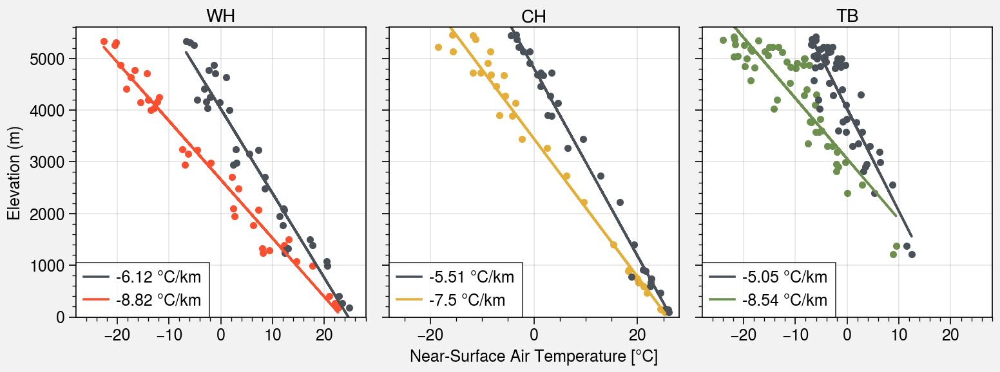

In [71]:
plot.rc.cycle = '538'

# Figure
f, axs = plot.subplots(nrows=1, ncols=3, share=3)
labels=['WH', 'CH', 'TB']
colors=['C1','C2','C3']

for i, ax in enumerate(axs):
    # Model
    ##########################
    x = concat[0].sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    y = orog.sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    xlabels = var_label
    ylabels = 'Elevation (m)'
    
    ax.scatter(x, y, label=labels[i], color=colors[i])
    # Regression
    reg = stats.linregress(x, y)
    h1 = ax.plot(x, reg.intercept + reg.slope*x, color=colors[i], 
                 label=str(round(1/reg.slope*1000,2))+' °C/km')

    # Obs
    ###########################
    x = obs_regrid_clim.sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    ax.scatter(x, y, label=labels[i], color='gray7')
    
    # regression
    reg = stats.linregress(x, y)
    h2 = ax.plot(x, reg.intercept + reg.slope*x, color='gray7', 
                 label=str(round(1/reg.slope*1000,2))+' °C/km')


    ax.format(xlabel=xlabels, ylabel=ylabels, xlim=(-28,28), ylim=(0,5600), title=labels[i])
    
    hs = [h1, h2]
    ax.legend(hs, loc='ll')
    

# f.save('img/'+var+'/orog_'+var+'_obs_model.png')
# f.save('img/'+var+'/orog_'+var+'_obs_model.pdf')

## Monthly global bias

In [18]:
da_historical_mon = da_historical.groupby('time.month').mean()
da_historical_mon.load()

da_amip_mon = da_amip.groupby('time.month').mean()
da_amip_mon.load()

da_land_hist_mon = da_land_hist.groupby('time.month').mean()
da_land_hist_mon.load()

da_HR_regrid_mon = da_HR_regrid.groupby('time.month').mean()
da_HR_regrid_mon.load()

obs_regrid_mon = obs_regrid.groupby('time.month').mean()
obs_regrid_mon.load()

/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/phd_v3/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


<xarray.DataArray 'tmp' (month: 12, lat: 143, lon: 144)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * lat      (lat) float32 -90.0 -88.73239 -87.46479 ... 87.46479 88.73239 90.0
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [19]:
import calendar as cld

In [20]:
var_label[:-5]

'Near-Surface Air Temperature'

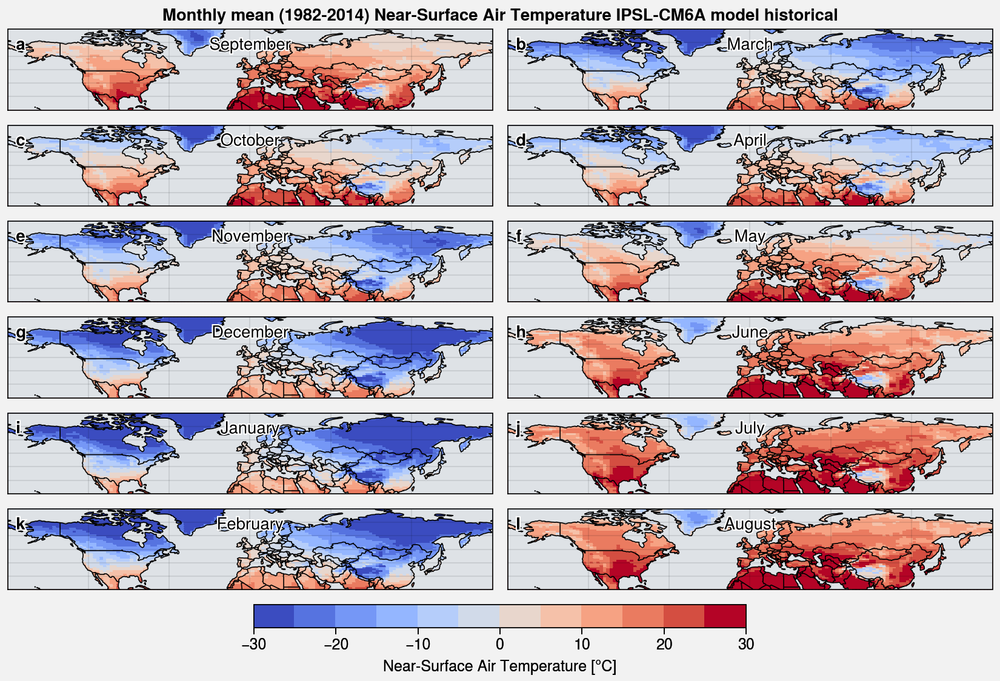

In [22]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_historical_mon.sel(month=i), cmap=cmap, levels=levels)
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label, loc='b', length=0.5)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" IPSL-CM6A model historical",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/tas_mon_clim_1982-2014_hist.jpg')

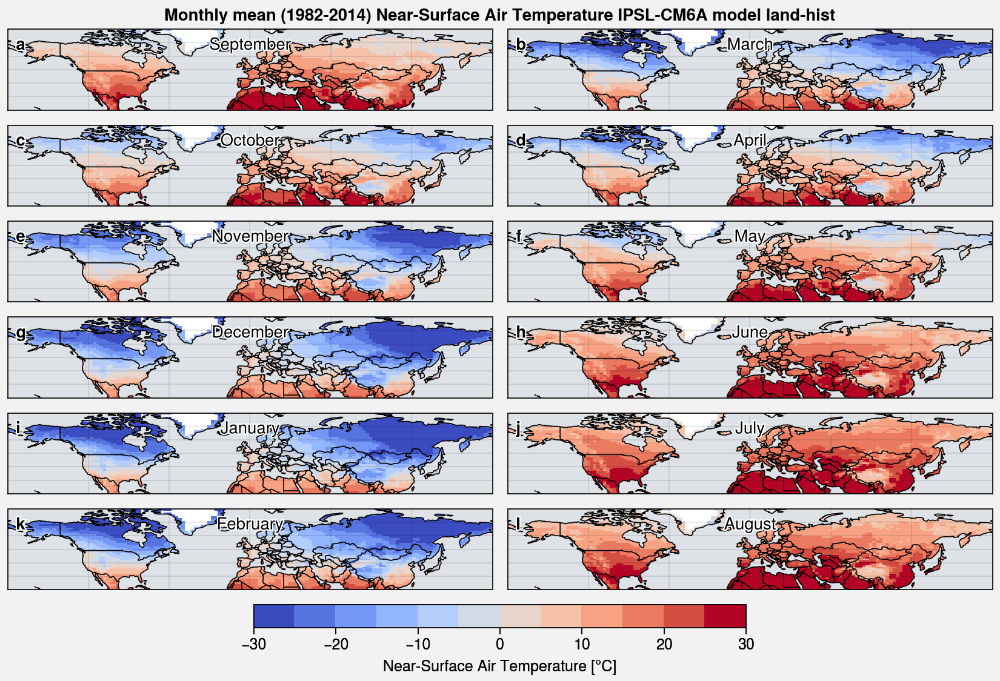

In [23]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_land_hist_mon.sel(month=i), cmap=cmap, levels=levels)
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label, loc='b', length=0.5)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" IPSL-CM6A model land-hist",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/tas_mon_clim_1982-2014_land-hist.jpg')

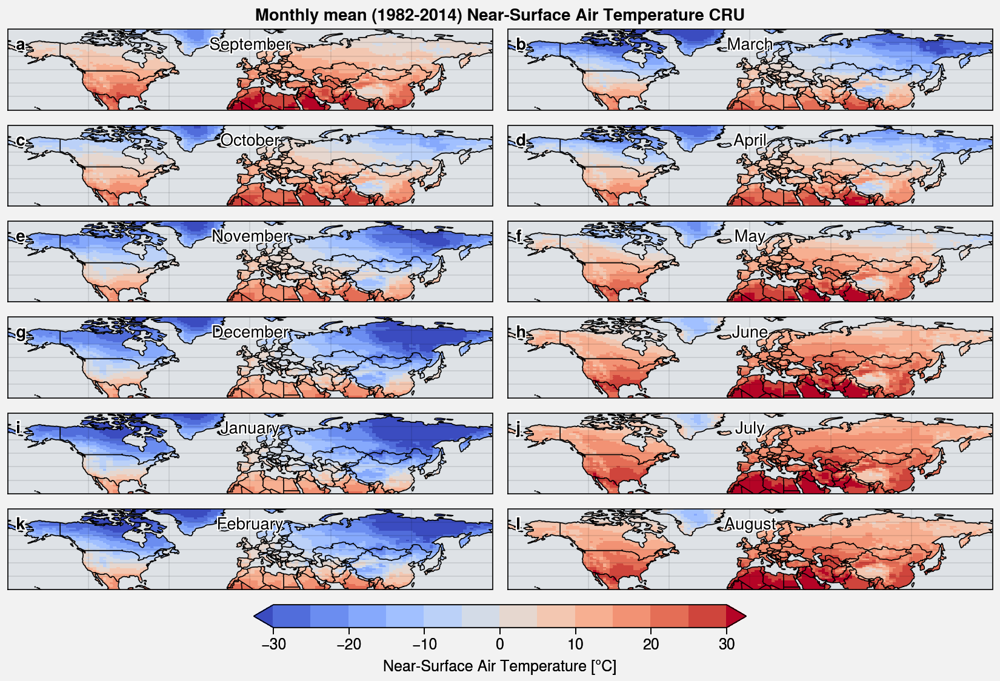

In [24]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(obs_regrid_mon.sel(month=i), cmap=cmap, levels=levels, extend='both')
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label, loc='b', length=0.5)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" CRU",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/tas_mon_clim_1982-2014_cru.jpg')

### Bias

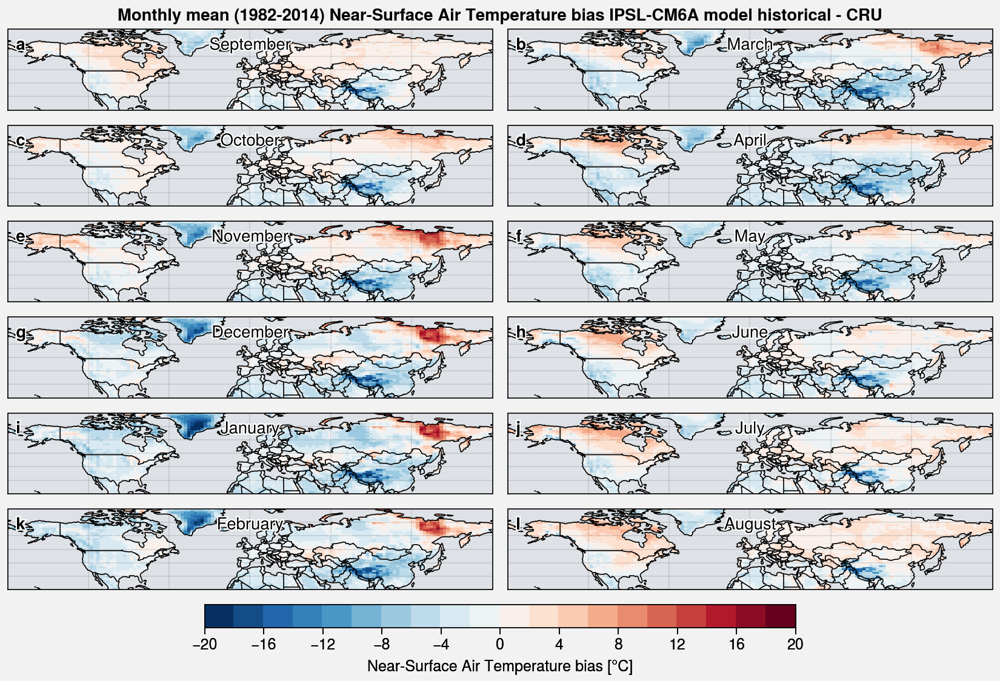

In [25]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_historical_mon.sel(month=i) - obs_regrid_mon.sel(month=i), cmap='BuRd', levels=plot.arange(-20,20,2))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-5]+' bias '+var_label[-4:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" bias IPSL-CM6A model historical - CRU",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/tas_mon_bias_1982-2014_hist_CRU.jpg')

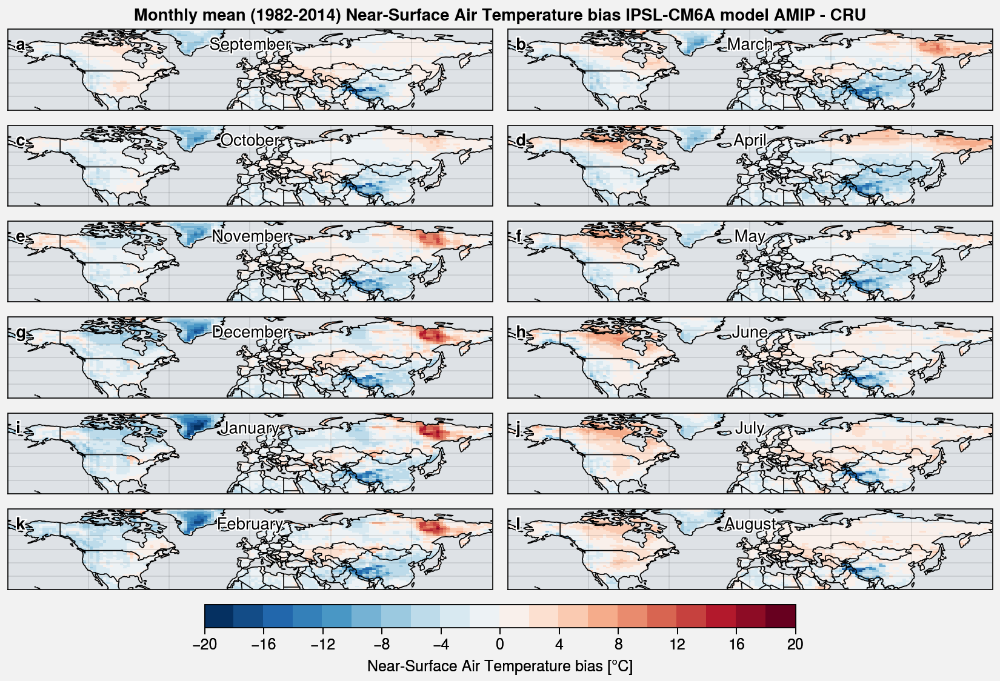

In [26]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_amip_mon.sel(month=i) - obs_regrid_mon.sel(month=i), cmap='BuRd', levels=plot.arange(-20,20,2))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-5]+' bias '+var_label[-4:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" bias IPSL-CM6A model AMIP - CRU",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/tas_mon_bias_1982-2014_AMIP_CRU.jpg')

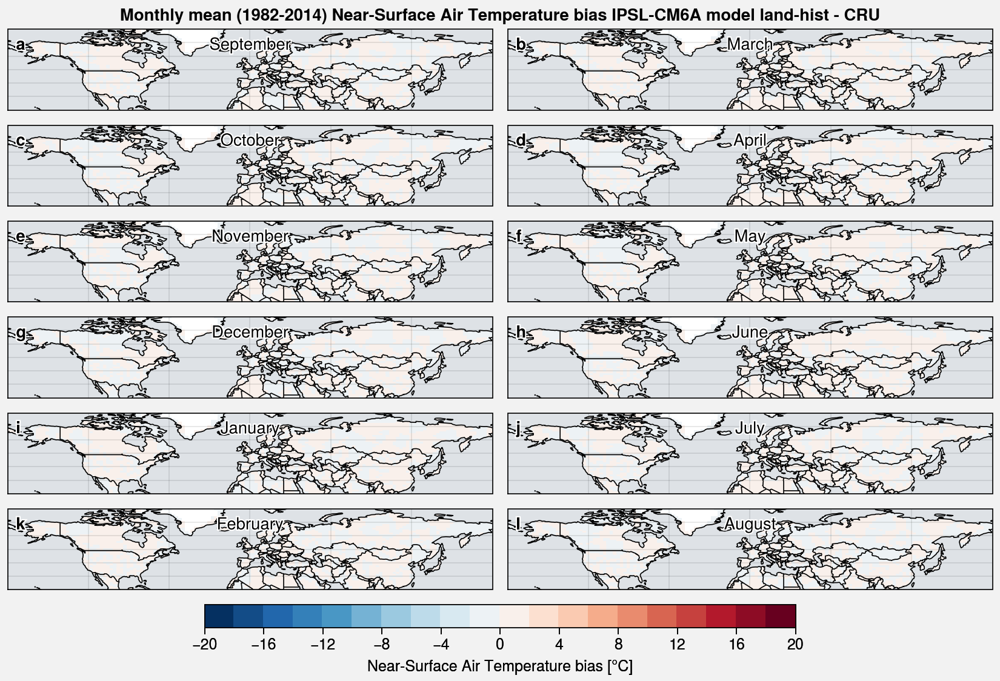

In [27]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_land_hist_mon.sel(month=i) - obs_regrid_mon.sel(month=i), cmap='BuRd', levels=plot.arange(-20,20,2))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-5]+' bias '+var_label[-4:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" bias IPSL-CM6A model land-hist - CRU",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/tas_mon_bias_1982-2014_land-hist_CRU.jpg')

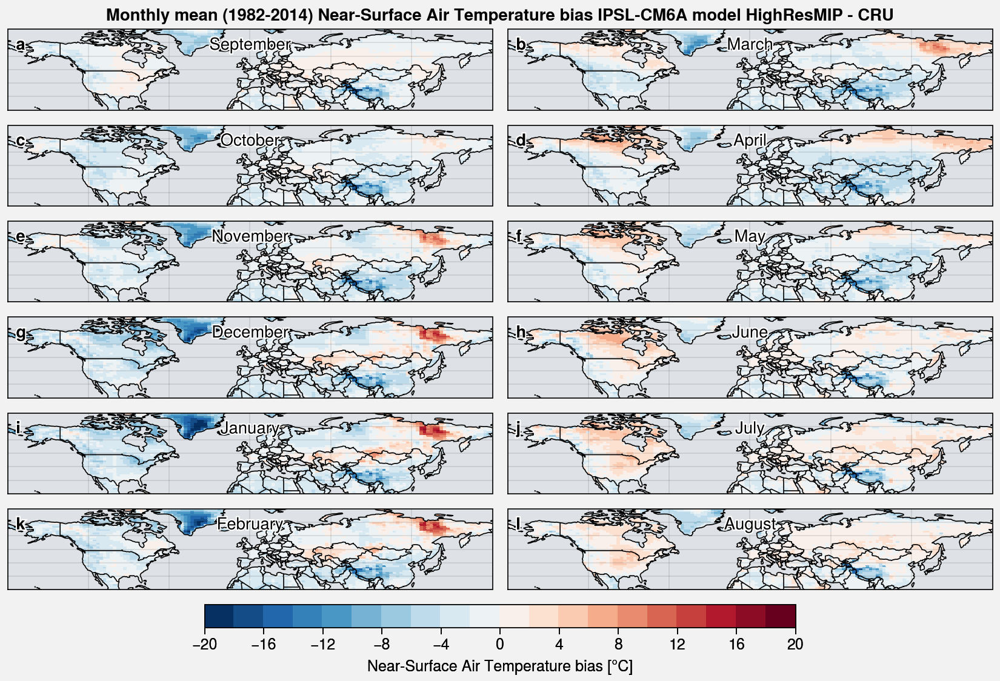

In [28]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_HR_regrid_mon.sel(month=i) - obs_regrid_mon.sel(month=i), cmap='BuRd', levels=plot.arange(-20,20,2))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-5]+' bias '+var_label[-4:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" bias IPSL-CM6A model HighResMIP - CRU",
    abc=True, abcloc='ul', latlim=(20, 80)
)

f.save('img/tas_mon_bias_1982-2014_HR_CRU.jpg')

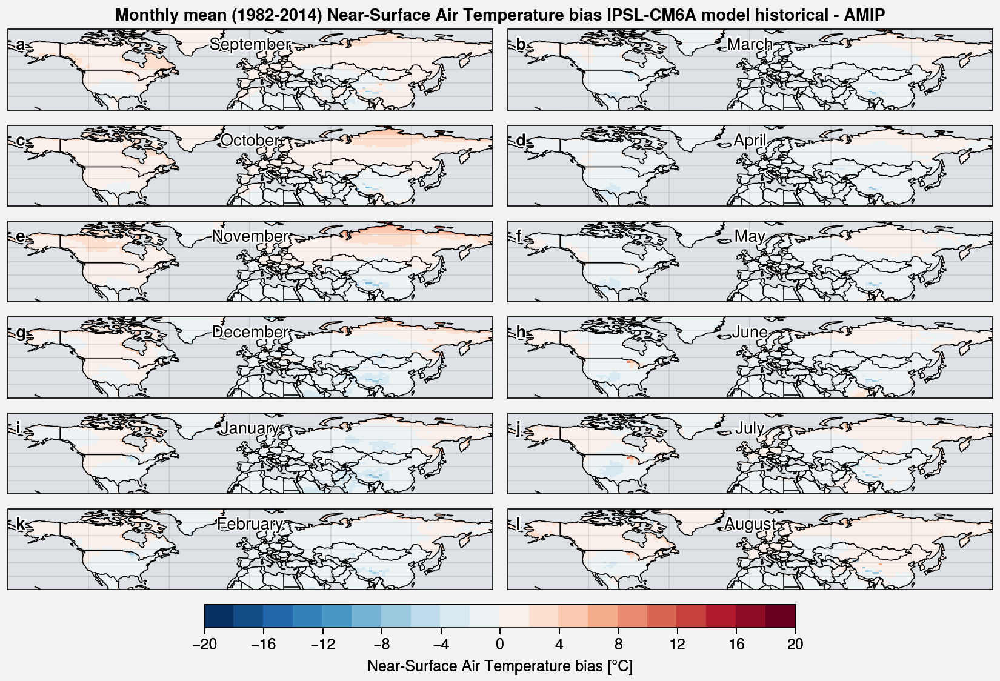

In [29]:
f, axs = plot.subplots(nrows=6, ncols=2, proj='cyl', axwidth=4)

for ax, i, i_ax in zip(axs, [9, 10, 11, 12, 1, 2, 3, 4, 5, 6, 7, 8], [0, 2, 4, 6, 8, 10, 1, 3, 5, 7, 9, 11]):
    m = axs[i_ax].pcolormesh(da_historical_mon.sel(month=i) - da_amip_mon.sel(month=i), cmap='BuRd', levels=plot.arange(-20,20,2))
    axs[i_ax].format(uctitle=cld.month_name[i])

f.colorbar(m, label=var_label[:-5]+' bias '+var_label[-4:], loc='b', length=0.6)

axs.format(
    labels=False, coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="Monthly mean (1982-2014) "+var_label[:-5]+" bias IPSL-CM6A model historical - AMIP",
    abc=True, abcloc='ul', latlim=(20, 80)
)